# Google Drive Mount(get data)

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pwd

/content


In [4]:
!unzip /content/drive/MyDrive/Mask_dataset/maskdataset_3C.zip -d /content/

Archive:  /content/drive/MyDrive/Mask_dataset/maskdataset_3C.zip
   creating: /content/maskdataset_3C/
  inflating: /content/maskdataset_3C/creating-files-data-and-name.py  
  inflating: /content/maskdataset_3C/creating-train-and-test-txt-files.py  
   creating: /content/maskdataset_3C/dataset/
   creating: /content/maskdataset_3C/dataset/images/
  inflating: /content/maskdataset_3C/dataset/images/maksssksksss0.png  
  inflating: /content/maskdataset_3C/dataset/images/maksssksksss1.png  
  inflating: /content/maskdataset_3C/dataset/images/maksssksksss10.png  
  inflating: /content/maskdataset_3C/dataset/images/maksssksksss100.png  
  inflating: /content/maskdataset_3C/dataset/images/maksssksksss101.png  
  inflating: /content/maskdataset_3C/dataset/images/maksssksksss102.png  
  inflating: /content/maskdataset_3C/dataset/images/maksssksksss103.png  
  inflating: /content/maskdataset_3C/dataset/images/maksssksksss104.png  
  inflating: /content/maskdataset_3C/dataset/images/maksssksksss

In [5]:
!mv /content/maskdataset_3C/* /content

In [6]:
!rmdir /content/maskdataset_3C

# Data Split

In [7]:
%cd /content
from glob import glob

img_list = glob('/content/dataset/images/*.png')

print(len(img_list))

/content
843


In [8]:
from sklearn.model_selection import train_test_split

train_img_list, val_img_list = train_test_split(img_list, test_size=0.2, random_state=2000)

print(len(train_img_list), len(val_img_list))

674 169


In [9]:
print('TRAIN_IMG : ', train_img_list)
print('VAL_IMG : ', val_img_list)

TRAIN_IMG :  ['/content/dataset/images/maksssksksss92.png', '/content/dataset/images/maksssksksss18.png', '/content/dataset/images/maksssksksss569.png', '/content/dataset/images/maksssksksss41.png', '/content/dataset/images/maksssksksss185.png', '/content/dataset/images/maksssksksss711.png', '/content/dataset/images/maksssksksss709.png', '/content/dataset/images/maksssksksss521.png', '/content/dataset/images/maksssksksss280.png', '/content/dataset/images/maksssksksss88.png', '/content/dataset/images/maksssksksss208.png', '/content/dataset/images/maksssksksss340.png', '/content/dataset/images/maksssksksss350.png', '/content/dataset/images/maksssksksss125.png', '/content/dataset/images/maksssksksss230.png', '/content/dataset/images/maksssksksss519.png', '/content/dataset/images/maksssksksss838.png', '/content/dataset/images/maksssksksss579.png', '/content/dataset/images/maksssksksss653.png', '/content/dataset/images/maksssksksss510.png', '/content/dataset/images/maksssksksss102.png', '/c

In [10]:
with open('/content/dataset/train.txt', 'w') as f:
  f.write('\n'.join(train_img_list) + '\n')

with open('/content/dataset/val.txt', 'w') as f:
  f.write('\n'.join(val_img_list) + '\n')

In [11]:
# configure .yaml file to guide the model for training
yaml_text = """train: /content/dataset/train.txt
val: /content/dataset/val.txt

nc: 3
names: ['mask', 'w_mask', 'no_mask']"""

with open("/content/dataset/data.yaml", 'w') as file:
    file.write(yaml_text)

%cat /content/dataset/data.yaml

train: /content/dataset/train.txt
val: /content/dataset/val.txt

nc: 3
names: ['mask', 'w_mask', 'no_mask']

# Get Yolov5

In [12]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 15002, done.
remote: Total 15002 (delta 0), reused 0 (delta 0), pack-reused 15002
Receiving objects: 100% (15002/15002), 14.08 MiB | 5.63 MiB/s, done.
Resolving deltas: 100% (10291/10291), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.0/184.0 KB 17.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 73.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.0/49.0 KB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 KB 18.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 7.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 9.2 MB/s eta 0:00:00
Setup complete. Using torch 1.13.1+cu116 (Tesla T4)


# Train Model

In [13]:
%%time
# about 25min

%cd /content/yolov5/
# batch 8 or 16
# epochs to 25~50
!python train.py --img 640 --batch 16 --epochs 150 --data /content/dataset/data.yaml --weights yolov5s.pt --cache --name mask_yolov5s_results # --cfg ./models/yolov5s.yaml

/content/yolov5
train: weights=yolov5s.pt, cfg=, data=/content/dataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=mask_yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl

In [14]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

# %load_ext tensorboard
# %tensorboard --logdir /content/yolov5/runs/train/mask_yolov5s_results/

Output hidden; open in https://colab.research.google.com to view.

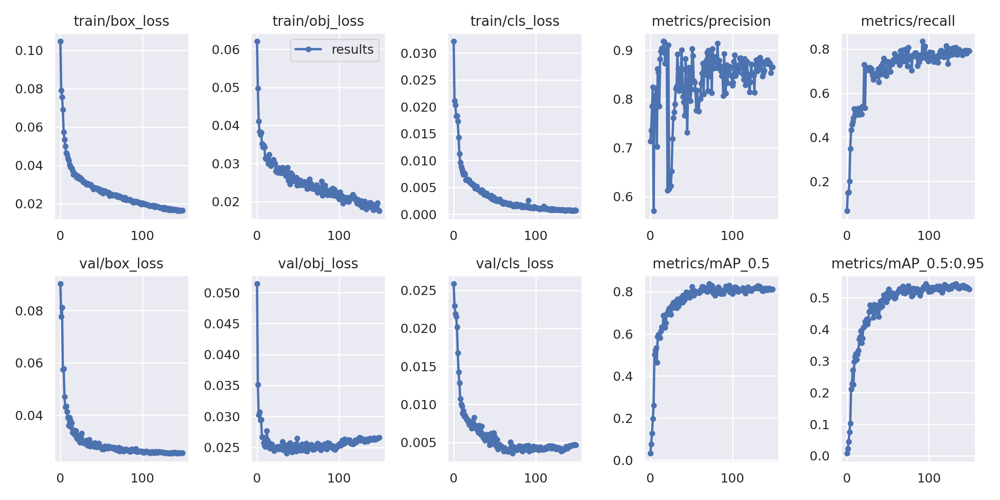

In [15]:
from IPython.display import Image

Image('/content/yolov5/runs/train/mask_yolov5s_results/results.png')

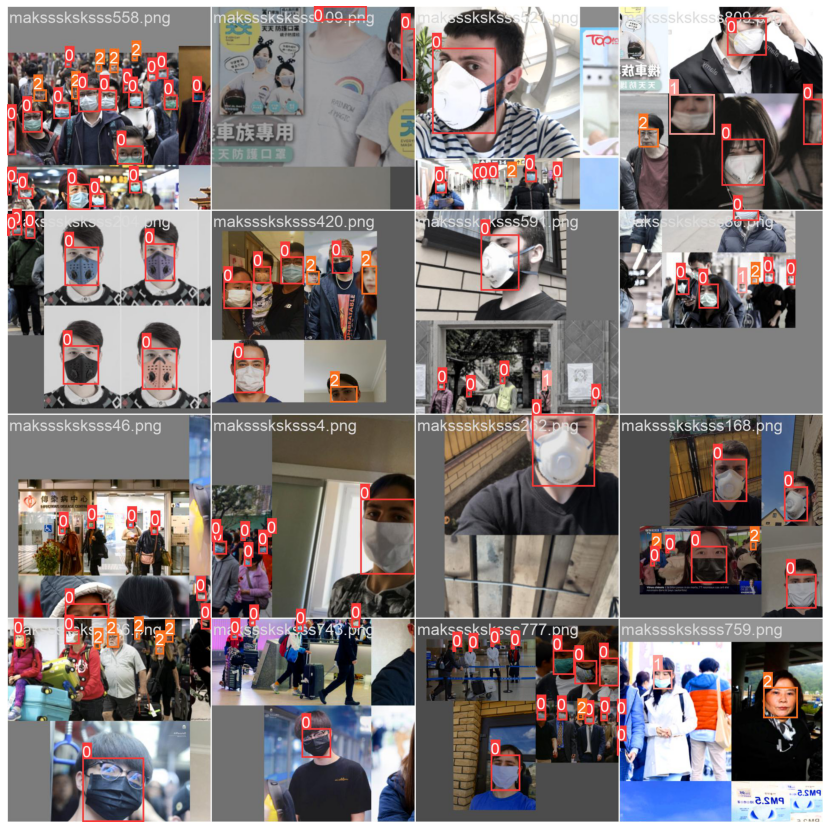

In [16]:
# lets visualize the training results

import matplotlib.pyplot as plt

img = plt.imread('/content/yolov5/runs/train/mask_yolov5s_results/train_batch0.jpg')
plt.figure(figsize=(20,15))
plt.imshow(img)
plt.axis('off')
plt.show()

# Model Validation

In [17]:
!pwd

/content/yolov5


In [18]:
!python val.py --data /content/dataset/data.yaml --img 640 --weights /content/yolov5/runs/train/mask_yolov5s_results/weights/best.pt

val: data=/content/dataset/data.yaml, weights=['/content/yolov5/runs/train/mask_yolov5s_results/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/dataset/val.cache... 169 images, 0 backgrounds, 0 corrupt: 100% 169/169 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 6/6 [00:06<00:00,  1.05s/it]
                   all        169        860      0.861      0.777      0.828      0.543
                  mask        169        682      0.947      0.891       0.94      0.659
        

# Model Test

In [19]:
# -- conf : conf_threshold(0~1) 해당 확률 이상일 경우만 바운딩 박스
!python detect.py --source /content/dataset/test/ --img 640 --weight /content/yolov5/runs/train/mask_yolov5s_results/weights/best.pt --conf 0.5 --name Mask_Test_Image

detect: weights=['/content/yolov5/runs/train/mask_yolov5s_results/weights/best.pt'], source=/content/dataset/test/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=Mask_Test_Image, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/10 /content/dataset/test/mask_test_1.png: 640x640 3 masks, 12.7ms
image 2/10 /content/dataset/test/mask_test_10.png: 640x448 1 no_mask, 13.4ms
image 3/10 /content/dataset/test/mask_test_2.png: 384x640 2 masks, 14.1ms
image 4/10 /content/dataset/test/mask_test_3.png: 640x512 1 mask, 12.7ms
im

In [20]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/Mask_Test_Image/*.png'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

Output hidden; open in https://colab.research.google.com to view.

# Save Model to Gdrive

In [21]:
cp -r /content/yolov5/runs/train/mask_yolov5s_results /content/drive/MyDrive/Mask_yolov5

In [22]:
#export your model's weights for future use
from google.colab import files
# files.download('./runs/train/exp/weights/best.pt')
files.download('/content/drive/MyDrive/Mask_yolov5/mask_yolov5s_results/weights/best.pt')

FileNotFoundError: ignored